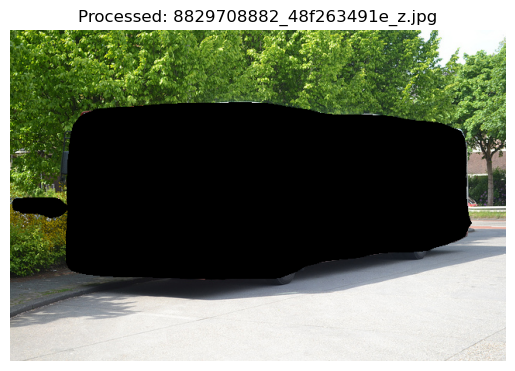

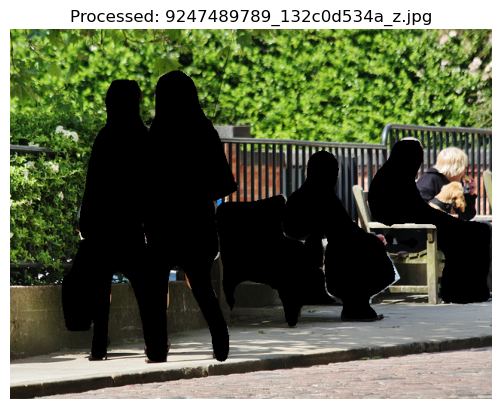

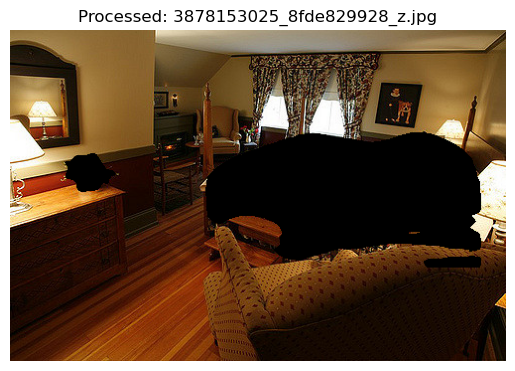

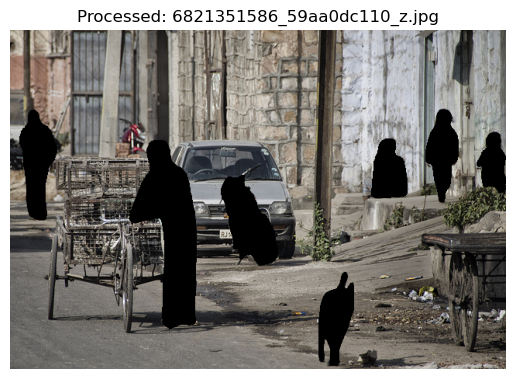

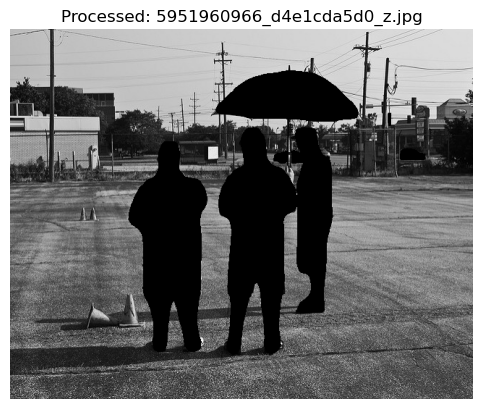

...

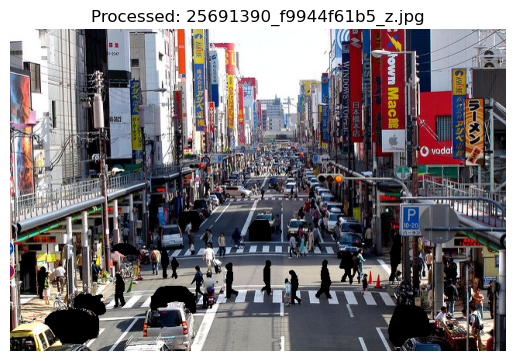

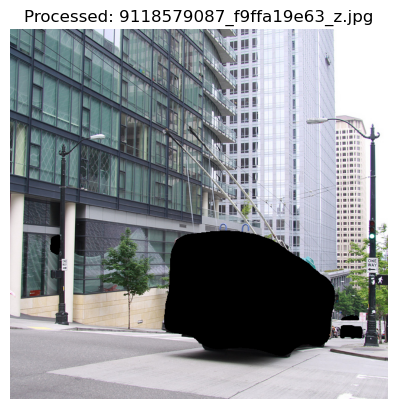

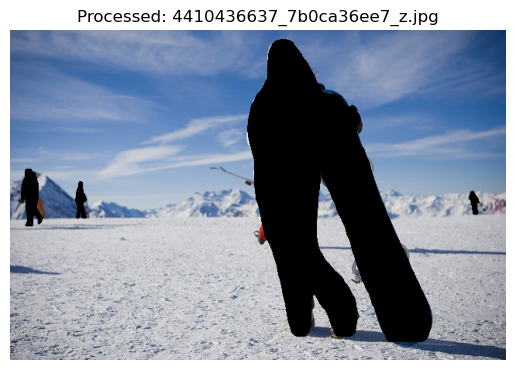

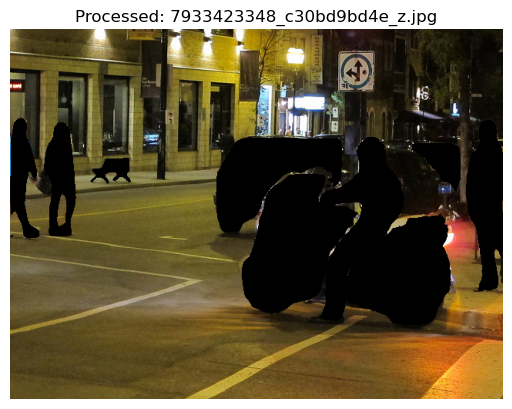

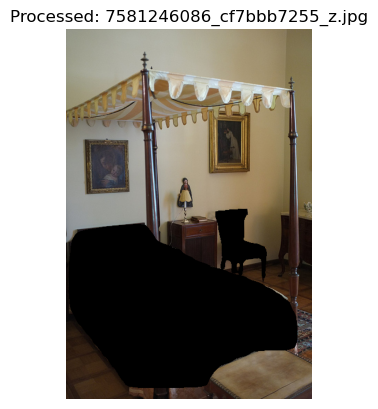

In [13]:
import os
import torch
from torchvision.models.detection import maskrcnn_resnet50_fpn
from torchvision.transforms import functional as F
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

# Load a pre-trained Mask R-CNN model
model = maskrcnn_resnet50_fpn(pretrained=True)
model.eval()

# Function to process and inpaint an image
def process_image(image_path):
    image = Image.open(image_path)
    image_tensor = F.to_tensor(image).unsqueeze(0)  # Add batch dimension

    # Run model on the image
    with torch.no_grad():
        predictions = model(image_tensor)

    # Extract the masks and apply them
    for i, mask in enumerate(predictions[0]['masks']):
        if predictions[0]['scores'][i] > 0.9:  # Confidence threshold
            mask = mask.squeeze().cpu().numpy()
            mask = np.where(mask > 0.5, 1, 0)
            # Apply mask to the image (for simplicity, black out the region)
            image_array = np.array(image)
            image_array[mask == 1] = 0
            image = Image.fromarray(image_array)

    return image

# Specify the folder containing images
image_folder = r"/Users/prem/Documents/Mask_RCNN-images"  # Update this path

# Process each image in the folder
for filename in os.listdir(image_folder):
    if filename.endswith(('.jpg', '.jpeg', '.png')):  # Adjust the extensions as needed
        image_path = os.path.join(image_folder, filename)
        processed_image = process_image(image_path)

        # Show the processed image
        plt.imshow(processed_image)
        plt.axis('off')
        plt.title(f"Processed: {filename}")
        plt.show()

In [14]:
import os
from PIL import Image
import numpy as np

def load_images(image_folder):
    images = {}
    
    # Load all images and store them in a dictionary by their dimensions
    try:
        for filename in os.listdir(image_folder):
            if filename.endswith(('.jpg', '.jpeg', '.png')):
                image_path = os.path.join(image_folder, filename)
                with Image.open(image_path) as img:
                    # Get dimensions
                    dimensions = img.size  # (width, height)
                    # Convert image to numpy array
                    img_array = np.array(img)
                    
                    if dimensions not in images:
                        images[dimensions] = []
                    images[dimensions].append((filename, img_array))
    except PermissionError as e:
        print(f"Permission error: {e}")
    except Exception as e:
        print(f"An error occurred: {e}")
    
    return images

def create_image_pairs(images):
    pairs = []
    
    # Create pairs from images with the same dimensions
    for dimension, imgs in images.items():
        if len(imgs) < 2:
            continue  # Skip if there are less than 2 images
        
        # Create pairs
        for i in range(len(imgs) - 1):
            pairs.append((imgs[i], imgs[i + 1]))  # Pair consecutive images
    
    return pairs

# Specify a different folder containing images
image_folder = r"/Users/prem/Documents/Mask_RCNN-images"  # Update this path to a new folder

# Load images from the folder
images_by_dimensions = load_images(image_folder)

# Create pairs of images with the same dimensions
image_pairs = create_image_pairs(images_by_dimensions)

# Output the pairs
for (img1, img2) in image_pairs:
    print(f"Pair: {img1[0]} and {img2[0]} (Dimensions: {img1[1].shape})")


Pair: 8829708882_48f263491e_z.jpg and 4782628554_668bc31826_z.jpg (Dimensions: (427, 640, 3))
Pair: 4782628554_668bc31826_z.jpg and 8239308689_efa6c11b08_z.jpg (Dimensions: (427, 640, 3))
Pair: 3800883468_12af3c0b50_z.jpg and 3132016470_c27baa00e8_z.jpg (Dimensions: (480, 640, 3))
Pair: 3132016470_c27baa00e8_z.jpg and 7933423348_c30bd9bd4e_z.jpg (Dimensions: (480, 640, 3))
Pair: 8512296263_5fc5458e20_z.jpg and 2516944023_d00345997d_z.jpg (Dimensions: (425, 640, 3))
Pair: 2516944023_d00345997d_z.jpg and 6584515005_fce9cec486_z.jpg (Dimensions: (425, 640, 3))
Pair: 8699757338_c3941051b6_z.jpg and 4410436637_7b0ca36ee7_z.jpg (Dimensions: (426, 640, 3))
Pair: 3862500489_6fd195d183_z.jpg and 2502287818_41e4b0c4fb_z.jpg (Dimensions: (640, 425, 3))
Pair: 2502287818_41e4b0c4fb_z.jpg and 7581246086_cf7bbb7255_z.jpg (Dimensions: (640, 425, 3))
Pair: 12283150_12d37e6389_z.jpg and 262985539_1709e54576_z.jpg (Dimensions: (375, 500, 3))


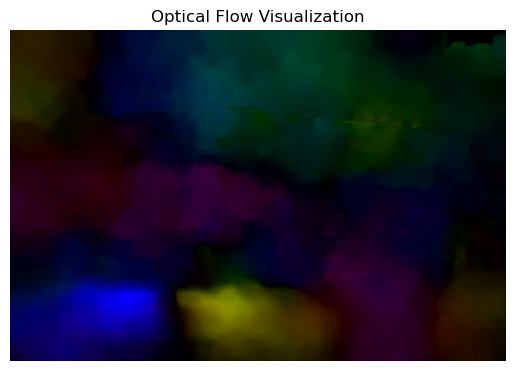

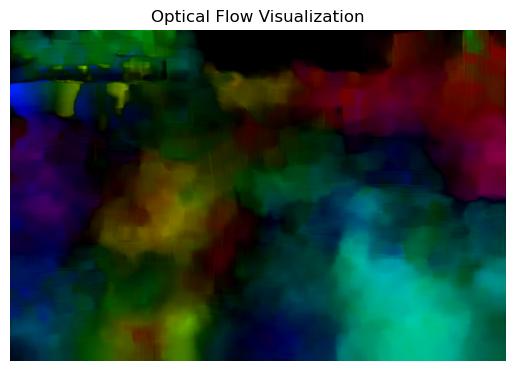

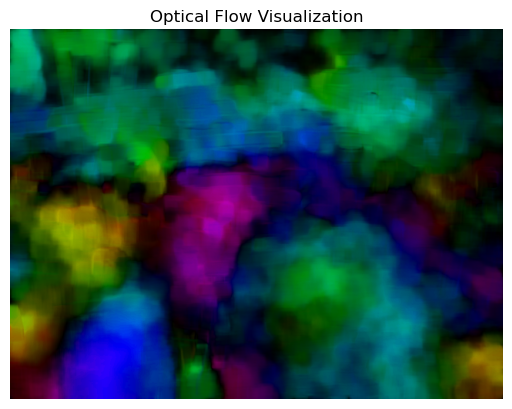

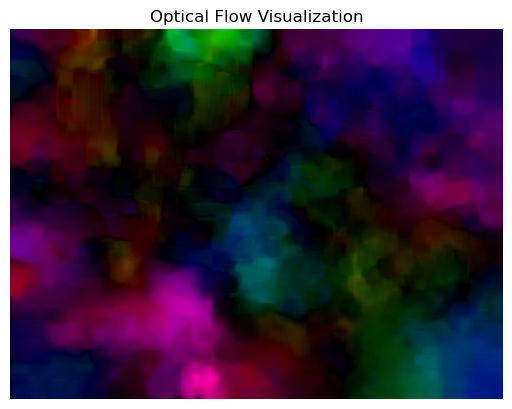

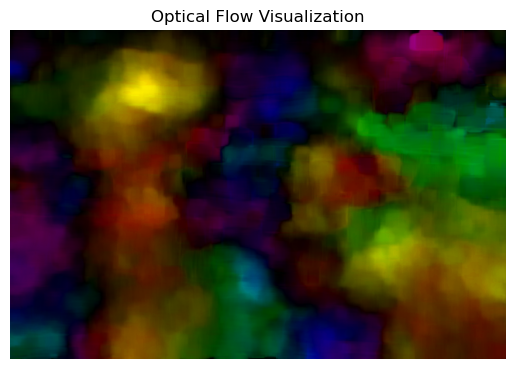

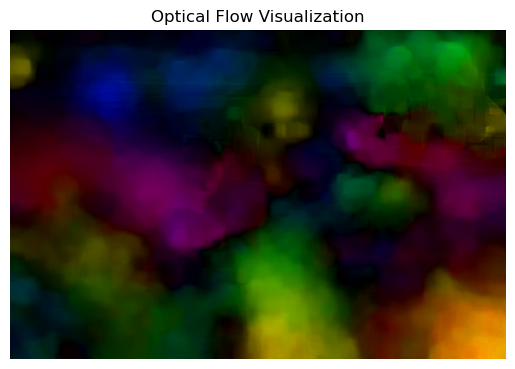

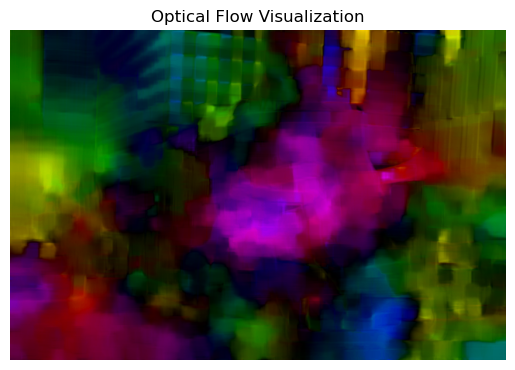

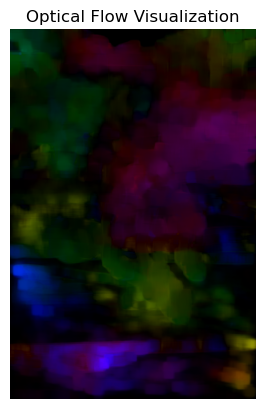

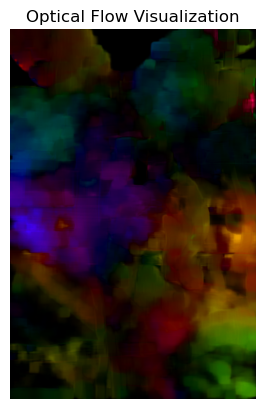

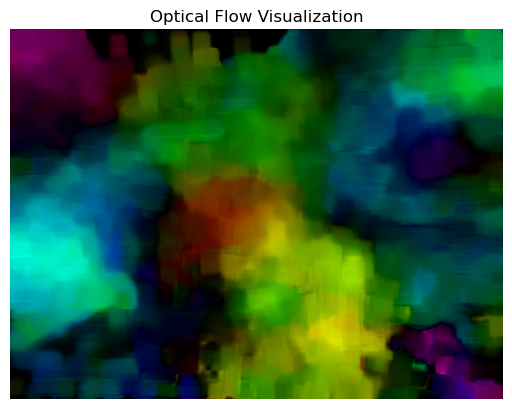

In [15]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Function to estimate optical flow using Farneback
def estimate_flow(prev_frame, curr_frame):
    # Convert frames to grayscale
    prev_gray = cv2.cvtColor(prev_frame, cv2.COLOR_BGR2GRAY)
    curr_gray = cv2.cvtColor(curr_frame, cv2.COLOR_BGR2GRAY)

    # Estimate optical flow
    flow = cv2.calcOpticalFlowFarneback(prev_gray, curr_gray, None, 0.5, 3, 15, 3, 5, 1.2, 0)
    
    return flow

# Function to visualize optical flow
def visualize_flow(flow, frame_shape):
    # Calculate magnitude and angle of the flow
    magnitude, angle = cv2.cartToPolar(flow[..., 0], flow[..., 1])

    # Normalize magnitude to [0, 1] for visualization
    magnitude = cv2.normalize(magnitude, None, 0, 1, cv2.NORM_MINMAX)

    # Create a color image to visualize the flow
    hsv = np.zeros((frame_shape[0], frame_shape[1], 3), dtype=np.uint8)
    hsv[..., 0] = angle * 180 / np.pi / 2  # Hue represents direction
    hsv[..., 1] = 255  # Saturation
    hsv[..., 2] = magnitude * 255  # Value represents magnitude

    # Convert HSV to BGR for visualization
    flow_image = cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)

    plt.imshow(flow_image)
    plt.title("Optical Flow Visualization")
    plt.axis('off')
    plt.show()

# Specify the folder containing images
image_folder = r"/Users/prem/Documents/Mask_RCNN-images"  # Update this path as needed

# Load images and create pairs
images_by_dimensions = load_images(image_folder)  # Ensure this function is defined
image_pairs = create_image_pairs(images_by_dimensions)  # Ensure this function is defined

# Process each pair for optical flow estimation
for (img1, img2) in image_pairs:
    prev_image = img1[1]  # Image array of the first image in the pair
    curr_image = img2[1]  # Image array of the second image in the pair

    # Estimate flow between the two frames
    flow = estimate_flow(prev_image, curr_image)

    # Visualize the optical flow
    visualize_flow(flow, prev_image.shape)  # Pass the shape of the previous frame


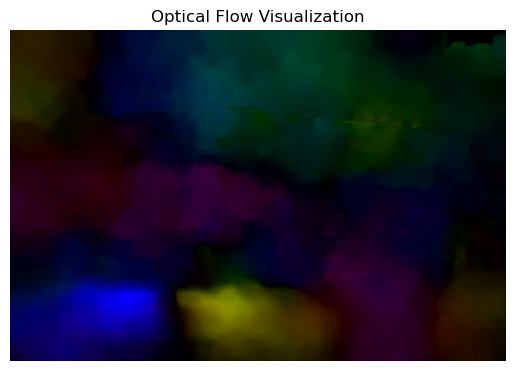

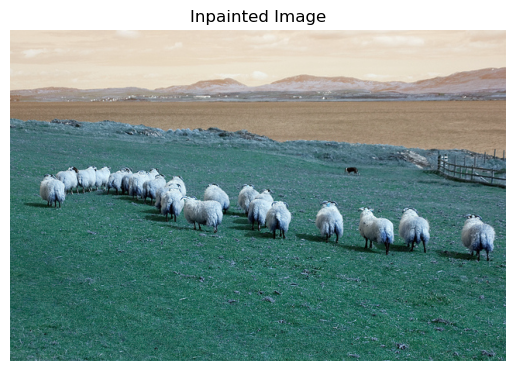

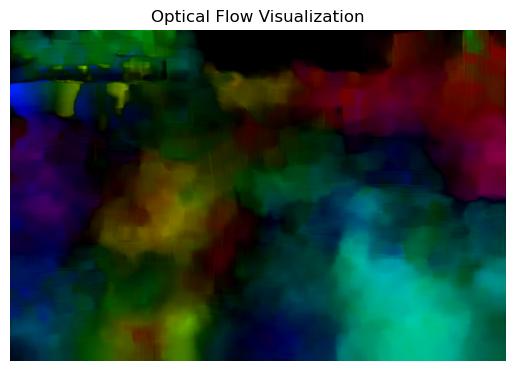

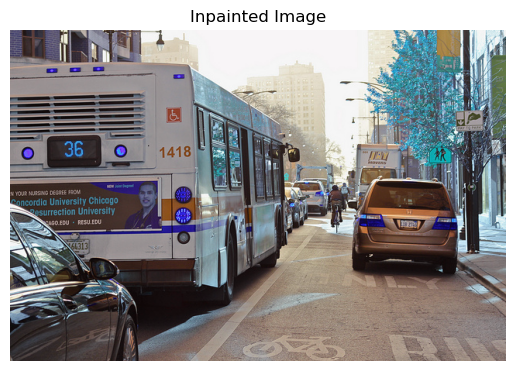

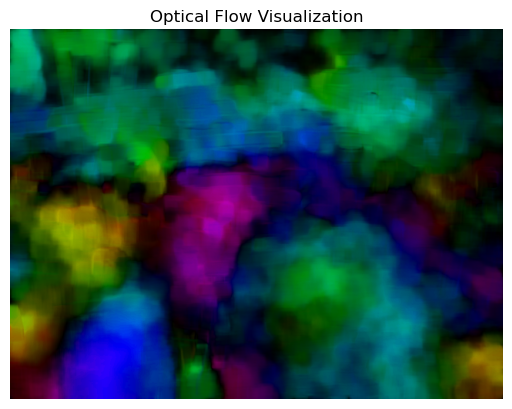

...

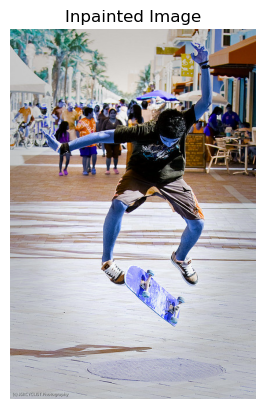

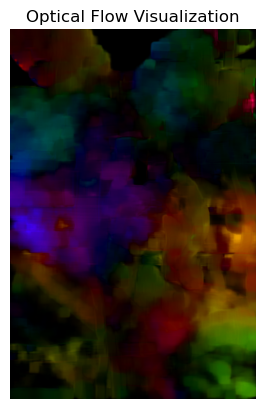

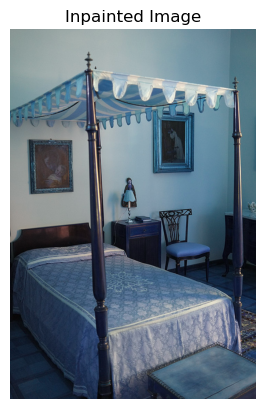

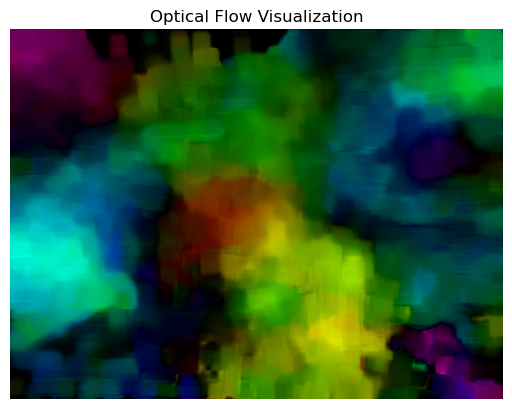

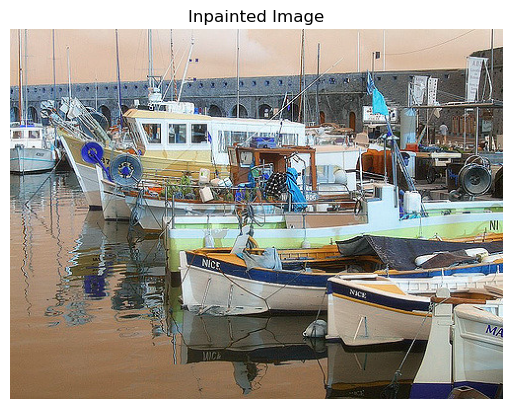

In [16]:
def inpaint_image(image, mask):
    # Use OpenCV's inpainting function
    inpainted_image = cv2.inpaint(image, mask, inpaintRadius=3, flags=cv2.INPAINT_TELEA)
    return inpainted_image

# Assuming `mask` is a binary mask of the area you want to inpaint
for (img1, img2) in image_pairs:
    prev_image = img1[1]  # Image array of the first image in the pair
    curr_image = img2[1]  # Image array of the second image in the pair

    # Estimate flow between the two frames
    flow = estimate_flow(prev_image, curr_image)

    # Visualize the optical flow
    visualize_flow(flow, prev_image.shape)  # Pass the shape of the previous frame

    # Create a binary mask for inpainting (replace with your mask creation logic)
    mask = np.zeros(prev_image.shape[:2], dtype=np.uint8)  # Placeholder mask; replace with actual mask

    # Inpaint the current image using the mask
    inpainted_image = inpaint_image(curr_image, mask)

    # Show inpainted result
    plt.imshow(cv2.cvtColor(inpainted_image, cv2.COLOR_BGR2RGB))
    plt.title("Inpainted Image")
    plt.axis('off')
    plt.show()
